In [1]:
from functions import *

2024-07-03 21:10:11.806187: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
# show original image (image from CelebA dataset)
image = Image.open("../CelebA/celebA/img_align_celeba/img_align_celeba/125478.jpg")
# image.show()

# image size
print("original image size:", image.size)

# resize image
resized_image = resize_image("../CelebA/celebA/img_align_celeba/img_align_celeba/125478.jpg")
# resized_image.show()

# resized image size
print("resized image size:", resized_image.size)

original image size: (178, 218)
resized image size: (256, 256)


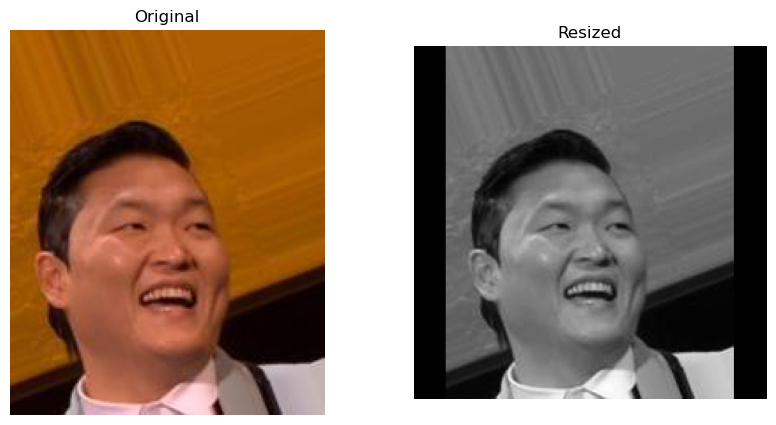

In [3]:
# show resized image in subplot
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(image)
ax[0].set_title("Original")
ax[0].axis("off")
# show in gray scale and without axis
ax[1].imshow(resized_image, cmap="gray")
ax[1].axis("off")
ax[1].set_title("Resized")
plt.show()

## Select Noise Level

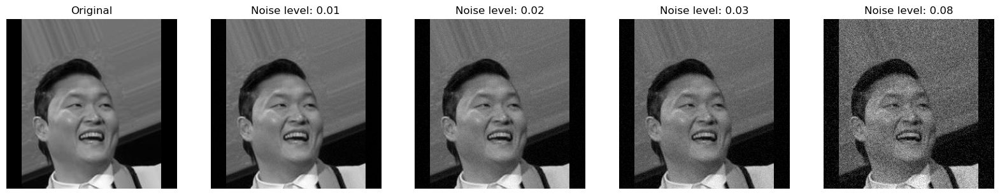

In [4]:
# subplot of original and different noise-level images (0.01, 0.02, 0.05, 0.1)
fig, ax = plt.subplots(1, 5, figsize=(20, 5))
ax[0].imshow(resized_image, cmap="gray")
ax[0].set_title("Original")
ax[0].axis("off")

for i, noise_level in enumerate([0.01, 0.02, 0.03, 0.08]):
    noisy_image_array = add_noise_to_image(np.array(resized_image), noise_level=noise_level, seed=42)
    ax[i + 1].imshow(noisy_image_array, cmap="gray")
    ax[i + 1].set_title(f"Noise level: {noise_level}")
    ax[i + 1].axis("off")

plt.show()

## Pre-process selected amount of images from CelebA dataset
### - Transform images to grayscale
### - Resize images to 256x256
### - Create noisy images with different noise levels
### - Save images to npy files separated in train and test sets

In [ ]:
# resize all images in celebA dataset to 256x256, and save them in a single more efficient .npy file
input_dir = "../CelebA/celebA/img_align_celeba/img_align_celeba/"

# get all image paths
image_paths = [os.path.join(input_dir, image_name) for image_name in os.listdir(input_dir)]

# create a numpy array to store all images
images = np.zeros((len(image_paths), 256, 256), dtype=np.uint8)
original_images = np.zeros((len(image_paths), 256, 256), dtype=np.uint8)

# resize and add noise to all images
for i, image_path in enumerate(image_paths):
    image = resize_image(image_path, size=(256, 256))
    original_images[i] = np.array(image)
    image = add_noise_to_image(np.array(image), noise_level=0.03, seed=42)
    images[i] = np.array(image)

# save images in a single .npy file
np.save("datasets/celeba_original", original_images)
np.save("datasets/celeba_noisy", images)

In [ ]:
# save 1000 images for training
np.save("datasets/original_1000_train", original_images[:1000])
np.save("datasets/noisy_1000_train", images[:1000])

In [ ]:
# save 300 images for testing
np.save("datasets/original_300_test", original_images[1000:1300])
np.save("datasets/noisy_300_test", images[1000:1300])

## Pre-process images from our own dataset
### - Transform images to grayscale
### - Resize images to 256x256

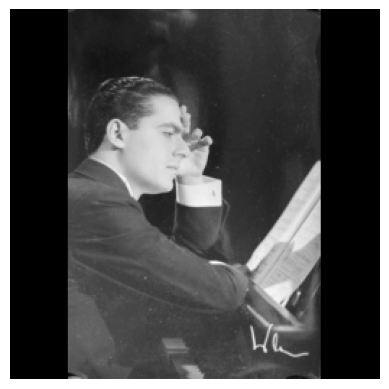

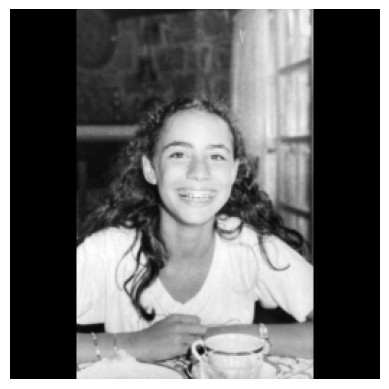

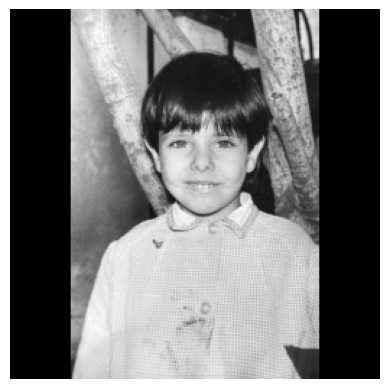

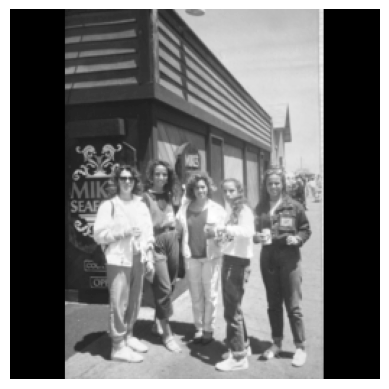

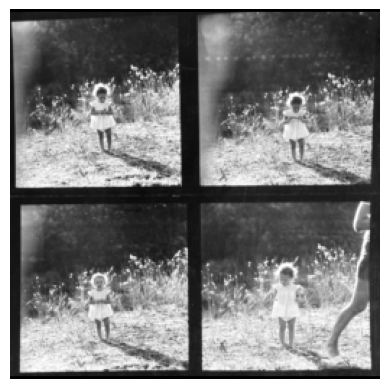

...

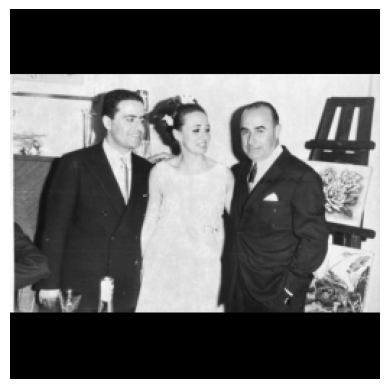

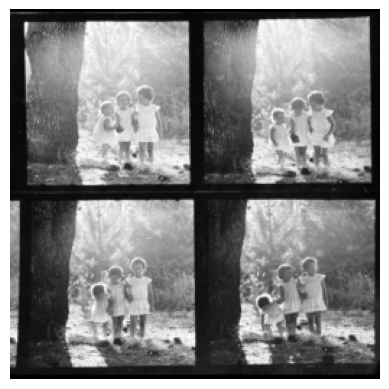

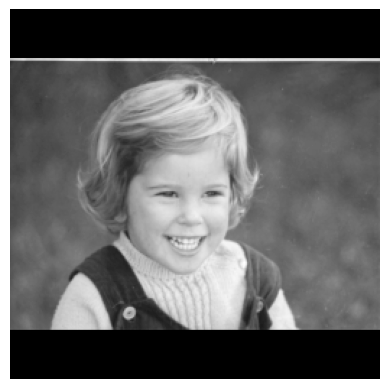

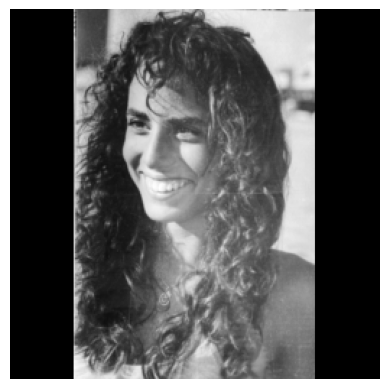

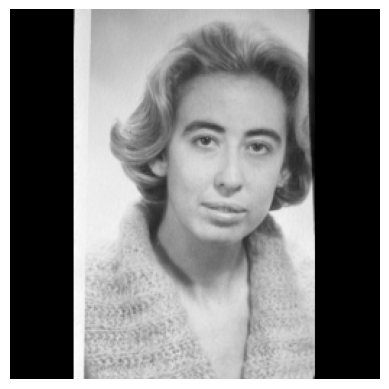

<Figure size 640x480 with 0 Axes>

In [12]:
output_dir = "preprocessed_images"
os.makedirs(output_dir, exist_ok=True)

# Get list of images in the directory
raw_images = [f"raw_images/{image_name}" for image_name in os.listdir("raw_images") if image_name.endswith(('.png', '.jpg', '.jpeg'))]  # Filters for common image formats

for img_path in raw_images:
    # Resize the image
    image = resize_image(img_path)
    
    # Display the image
    plt.imshow(image, cmap="gray")
    plt.axis("off")
    plt.show()  # Uncomment this if you want to see the image as it is processed
    
    # Save the image
    save_path = f"{output_dir}/{os.path.basename(img_path)}"
    image.save(save_path)  # Saving using PIL's save method to maintain image quality

    # Clear the current figure in matplotlib to avoid display issues
    plt.clf()